In [1]:
from IPython.display import clear_output

!pip install pycocotools

clear_output(wait=False)

In [2]:
# --- Standard Imports ---
import os
import random
import numpy as np
import pandas as pd
import cv2
from PIL import Image
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import json

# --- PyTorch Imports ---
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms, models

# --- COCO Annotations Import ---
from pycocotools.coco import COCO

# --- Environment Setup ---
# Set seed for reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.backends.cudnn.deterministic = True

# Set up device (GPU if available, otherwise CPU)
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {DEVICE}")

# --- Dataset Paths ---
IMAGE_DIR = '/kaggle/input/asphalt-segmentation-dataset/train/'
ANNOTATION_FILE = '/kaggle/input/asphalt-segmentation-dataset/train/_annotations.coco.json'

Using device: cuda


In [3]:
class AsphaltDataset(Dataset):
    """
    Custom PyTorch Dataset for loading asphalt images and their segmentation masks.
    """
    def __init__(self, image_dir, annotation_file, transform=None, augment_fn=None):
        self.image_dir = image_dir
        self.coco = COCO(annotation_file)
        self.image_ids = list(sorted(self.coco.imgs.keys()))
        self.transform = transform
        self.augment_fn = augment_fn

    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, idx):
        # Get image information
        img_id = self.image_ids[idx]
        img_info = self.coco.loadImgs(img_id)[0]
        img_path = os.path.join(self.image_dir, img_info['file_name'])

        # Load image
        image = Image.open(img_path).convert('RGB')
        
        # Create mask
        mask = self.create_mask(img_id, img_info['height'], img_info['width'])
        mask = Image.fromarray(mask) # Convert numpy mask to PIL image for transformations

        # Apply augmentations if provided
        if self.augment_fn:
            image, mask = self.augment_fn(image, mask)

        # Apply transformations (resize, normalize, etc.)
        if self.transform:
            image = self.transform['image'](image)
            mask = self.transform['mask'](mask)

        # CRITICAL: Ensure mask values are 0.0 or 1.0.
        # The 'mask' transform handles this correctly by avoiding standard ToTensor scaling.
        # Squeeze to remove the channel dimension if it's 1, making it [H, W]
        mask = mask.squeeze(0)

        return image, mask

    def create_mask(self, img_id, height, width):
        """Generates a single binary mask from all annotations for a given image."""
        ann_ids = self.coco.getAnnIds(imgIds=img_id)
        anns = self.coco.loadAnns(ann_ids)
        
        # Start with an empty mask
        mask = np.zeros((height, width), dtype=np.uint8)

        # Iterate through annotations and draw polygons on the mask
        for ann in anns:
            # The COCO API's annToMask returns a binary mask for a single annotation
            single_ann_mask = self.coco.annToMask(ann)
            mask = np.maximum(mask, single_ann_mask) # Combine masks
            
        return mask

# Define transformations
# IMPORTANT: Masks must use Nearest Neighbor interpolation to preserve binary values
# Images use Bilinear interpolation, which is standard.
IMG_SIZE = 512

# For models trained WITHOUT augmentation
base_transforms = {
    'image': transforms.Compose([
        transforms.Resize((IMG_SIZE, IMG_SIZE), interpolation=Image.BILINEAR),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ]),
    'mask': transforms.Compose([
        transforms.Resize((IMG_SIZE, IMG_SIZE), interpolation=Image.NEAREST),
        # Custom lambda to convert PIL to Tensor without scaling by 255
        transforms.Lambda(lambda mask_pil: torch.from_numpy(np.array(mask_pil)).unsqueeze(0).float())
    ])
}

loading annotations into memory...
Done (t=0.15s)
creating index...
index created!
Dataset sizes:
  - Training: 1454
  - Validation: 311
  - Test: 313


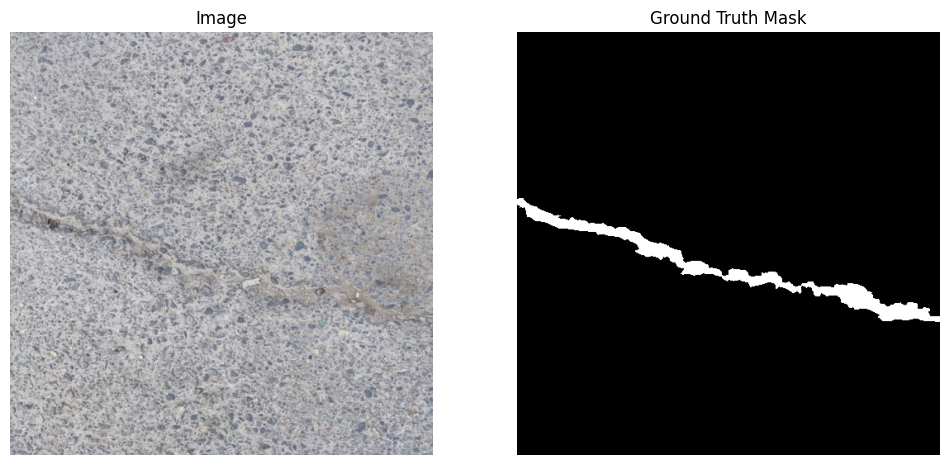

Unique values in mask tensor: tensor([0., 1.])
Mask tensor shape: torch.Size([512, 512])
Image tensor shape: torch.Size([3, 512, 512])


In [4]:
# Instantiate the full dataset
full_dataset = AsphaltDataset(
    image_dir=IMAGE_DIR,
    annotation_file=ANNOTATION_FILE,
    transform=base_transforms
)

# --- Data Splitting ---
dataset_size = len(full_dataset)
train_size = int(0.7 * dataset_size)
val_size = int(0.15 * dataset_size)
test_size = dataset_size - train_size - val_size

train_dataset, val_dataset, test_dataset = random_split(
    full_dataset, [train_size, val_size, test_size]
)

print(f"Dataset sizes:")
print(f"  - Training: {len(train_dataset)}")
print(f"  - Validation: {len(val_dataset)}")
print(f"  - Test: {len(test_dataset)}")

# --- Create DataLoaders ---
BATCH_SIZE = 8

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

# --- Visualize a Sample ---
def show_sample(image, mask):
    # De-normalize the image tensor for visualization
    inv_normalize = transforms.Normalize(
        mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
        std=[1/0.229, 1/0.224, 1/0.225]
    )
    image = inv_normalize(image)
    image = image.permute(1, 2, 0).cpu().numpy()
    mask = mask.cpu().numpy()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.title("Image")
    plt.imshow(image)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title("Ground Truth Mask")
    plt.imshow(mask, cmap='gray')
    plt.axis('off')
    plt.show()

# Fetch and show one sample
sample_image, sample_mask = train_dataset[10] # Get a sample
show_sample(sample_image, sample_mask)
print(f"Unique values in mask tensor: {torch.unique(sample_mask)}")
print(f"Mask tensor shape: {sample_mask.shape}")
print(f"Image tensor shape: {sample_image.shape}")

In [5]:
# --- Loss Function ---
class DiceBCELoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceBCELoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        # Apply sigmoid to model output
        inputs = torch.sigmoid(inputs)

        # Flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)

        intersection = (inputs * targets).sum()
        dice_loss = 1 - (2. * intersection + smooth) / (inputs.sum() + targets.sum() + smooth)
        BCE = nn.BCELoss()(inputs, targets)
        Dice_BCE = BCE + dice_loss

        return Dice_BCE

# --- Training Loop ---
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=25):
    history = {'train_loss': [], 'val_loss': []}
    best_val_loss = float('inf')
    best_model_wts = None

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        
        progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Train]")
        for inputs, masks in progress_bar:
            inputs, masks = inputs.to(DEVICE), masks.to(DEVICE).unsqueeze(1) # Add channel dim to mask
            
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item() * inputs.size(0)
            progress_bar.set_postfix(loss=loss.item())

        epoch_loss = running_loss / len(train_loader.dataset)
        history['train_loss'].append(epoch_loss)

        # --- Validation ---
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            progress_bar_val = tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Val]")
            for inputs, masks in progress_bar_val:
                inputs, masks = inputs.to(DEVICE), masks.to(DEVICE).unsqueeze(1)
                outputs = model(inputs)
                loss = criterion(outputs, masks)
                val_loss += loss.item() * inputs.size(0)
                progress_bar_val.set_postfix(val_loss=loss.item())
        
        epoch_val_loss = val_loss / len(val_loader.dataset)
        history['val_loss'].append(epoch_val_loss)

        print(f"Epoch {epoch+1}/{num_epochs} -> Train Loss: {epoch_loss:.4f}, Val Loss: {epoch_val_loss:.4f}")

        # Save the best model
        if epoch_val_loss < best_val_loss:
            best_val_loss = epoch_val_loss
            best_model_wts = model.state_dict()
            print("  -> New best model saved!")

    model.load_state_dict(best_model_wts)
    return model, history

# --- Plotting Function ---
def plot_loss_curves(history, model_name):
    plt.figure(figsize=(10, 5))
    plt.plot(history['train_loss'], label='Train Loss')
    plt.plot(history['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curves for {model_name}')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

# --- Metrics Calculation ---
def calculate_metrics(model, loader, device):
    model.eval()
    total_iou = 0
    total_dice = 0
    num_samples = 0

    with torch.no_grad():
        for inputs, masks in tqdm(loader, desc="Calculating Metrics"):
            inputs, masks = inputs.to(device), masks.to(device)
            outputs = model(inputs)
            preds = torch.sigmoid(outputs) > 0.5
            
            # For each item in the batch
            for i in range(inputs.size(0)):
                pred_mask = preds[i].squeeze().byte()
                true_mask = masks[i].squeeze().byte()

                intersection = (pred_mask & true_mask).sum().item()
                union = (pred_mask | true_mask).sum().item()
                
                # Dice score calculation
                dice = (2. * intersection) / (pred_mask.sum().item() + true_mask.sum().item() + 1e-7)
                
                # IoU calculation
                iou = intersection / (union + 1e-7)

                total_iou += iou
                total_dice += dice
                num_samples += 1
    
    avg_iou = total_iou / num_samples
    avg_dice = total_dice / num_samples
    return avg_iou, avg_dice

In [6]:
# --- Encoder Block ---
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ConvBlock, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
    def forward(self, x):
        return self.conv(x)

# --- U-Net Architecture ---
class UNetBaseline(nn.Module):
    def __init__(self, in_channels=3, out_channels=1, features=[64, 128, 256, 512]):
        super(UNetBaseline, self).__init__()
        self.ups = nn.ModuleList()
        self.downs = nn.ModuleList()
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Encoder Part
        for feature in features:
            self.downs.append(ConvBlock(in_channels, feature))
            in_channels = feature
        
        # Decoder Part
        for feature in reversed(features):
            self.ups.append(
                nn.ConvTranspose2d(feature*2, feature, kernel_size=2, stride=2)
            )
            self.ups.append(ConvBlock(feature*2, feature))

        # Bottleneck
        self.bottleneck = ConvBlock(features[-1], features[-1]*2)
        # Final convolution
        self.final_conv = nn.Conv2d(features[0], out_channels, kernel_size=1)

    def forward(self, x):
        skip_connections = []

        # Encoder path
        for down in self.downs:
            x = down(x)
            skip_connections.append(x)
            x = self.pool(x)
        
        x = self.bottleneck(x)
        skip_connections = skip_connections[::-1] # Reverse for decoder

        # Decoder path
        for idx in range(0, len(self.ups), 2):
            x = self.ups[idx](x)
            skip_connection = skip_connections[idx//2]
            
            # Handle size mismatch if any
            if x.shape != skip_connection.shape:
                x = transforms.functional.resize(x, size=skip_connection.shape[2:])

            concat_skip = torch.cat((skip_connection, x), dim=1)
            x = self.ups[idx+1](concat_skip)

        return self.final_conv(x)

--- Training Model A: Baseline Custom CNN ---


Epoch 1/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 1/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 1/20 -> Train Loss: 1.3073, Val Loss: 1.1819
  -> New best model saved!


Epoch 2/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 2/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 2/20 -> Train Loss: 1.1009, Val Loss: 1.0602
  -> New best model saved!


Epoch 3/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 3/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 3/20 -> Train Loss: 0.9768, Val Loss: 0.9449
  -> New best model saved!


Epoch 4/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 4/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 4/20 -> Train Loss: 0.8842, Val Loss: 0.8662
  -> New best model saved!


Epoch 5/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 5/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 5/20 -> Train Loss: 0.7914, Val Loss: 0.7948
  -> New best model saved!


Epoch 6/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 6/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 6/20 -> Train Loss: 0.7238, Val Loss: 0.7005
  -> New best model saved!


Epoch 7/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 7/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 7/20 -> Train Loss: 0.6431, Val Loss: 0.6337
  -> New best model saved!


Epoch 8/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 8/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 8/20 -> Train Loss: 0.5966, Val Loss: 0.6099
  -> New best model saved!


Epoch 9/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 9/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 9/20 -> Train Loss: 0.5546, Val Loss: 0.5664
  -> New best model saved!


Epoch 10/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 10/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 10/20 -> Train Loss: 0.5142, Val Loss: 0.5402
  -> New best model saved!


Epoch 11/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 11/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 11/20 -> Train Loss: 0.4941, Val Loss: 0.5064
  -> New best model saved!


Epoch 12/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 12/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 12/20 -> Train Loss: 0.4813, Val Loss: 0.5314


Epoch 13/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 13/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 13/20 -> Train Loss: 0.4635, Val Loss: 0.5015
  -> New best model saved!


Epoch 14/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 14/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 14/20 -> Train Loss: 0.4488, Val Loss: 0.4663
  -> New best model saved!


Epoch 15/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 15/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 15/20 -> Train Loss: 0.4361, Val Loss: 0.4737


Epoch 16/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 16/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 16/20 -> Train Loss: 0.4173, Val Loss: 0.4591
  -> New best model saved!


Epoch 17/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 17/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 17/20 -> Train Loss: 0.4128, Val Loss: 0.4633


Epoch 18/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 18/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 18/20 -> Train Loss: 0.4068, Val Loss: 0.4729


Epoch 19/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 19/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 19/20 -> Train Loss: 0.4015, Val Loss: 0.4625


Epoch 20/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 20/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 20/20 -> Train Loss: 0.3947, Val Loss: 0.4677


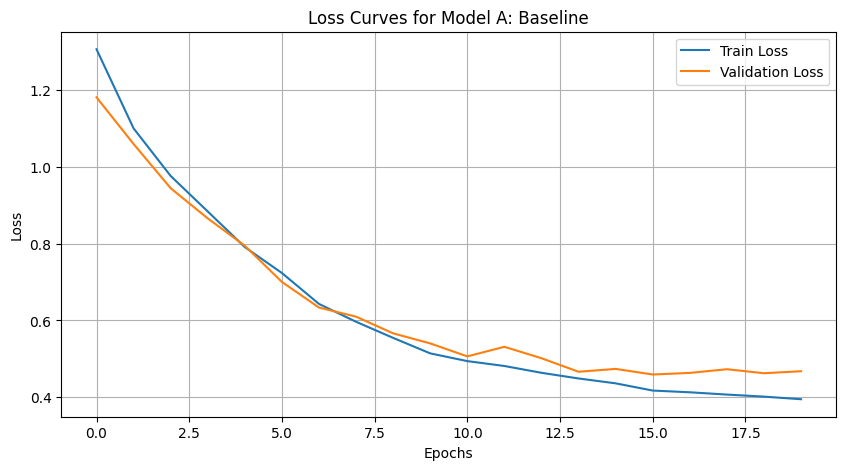

In [7]:
# --- Model A: Baseline Training ---
print("--- Training Model A: Baseline Custom CNN ---")

# Initialize Model, Loss, and Optimizer
model_a = UNetBaseline(in_channels=3, out_channels=1).to(DEVICE)
criterion_a = DiceBCELoss()
optimizer_a = optim.Adam(model_a.parameters(), lr=1e-4)

# Train the model
model_a, history_a = train_model(
    model_a, train_loader, val_loader, criterion_a, optimizer_a, num_epochs=20
)

# Save the model weights
torch.save(model_a.state_dict(), 'model_a_baseline.pth')

# Plot the loss curves
plot_loss_curves(history_a, "Model A: Baseline")

--- Evaluating Model A: Baseline on Test Set ---


Calculating Metrics:   0%|          | 0/40 [00:00<?, ?it/s]


Model A - Test Set Performance:
  - Average Intersection over Union (IoU): 0.4198
  - Average Dice Score: 0.5292

--- Visualizing Model A Predictions on Test Images ---


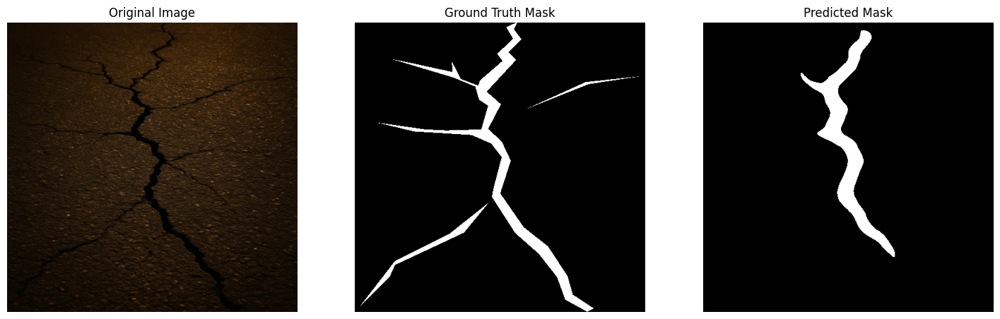

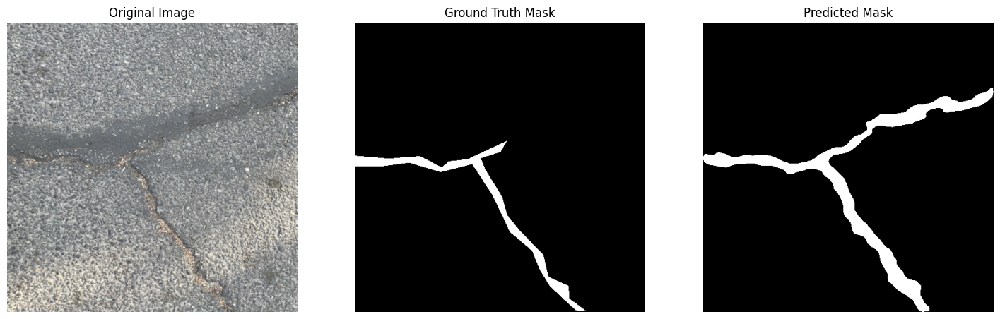

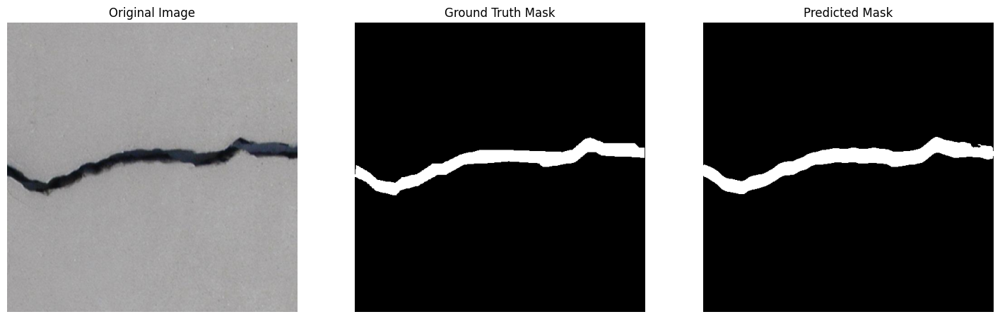

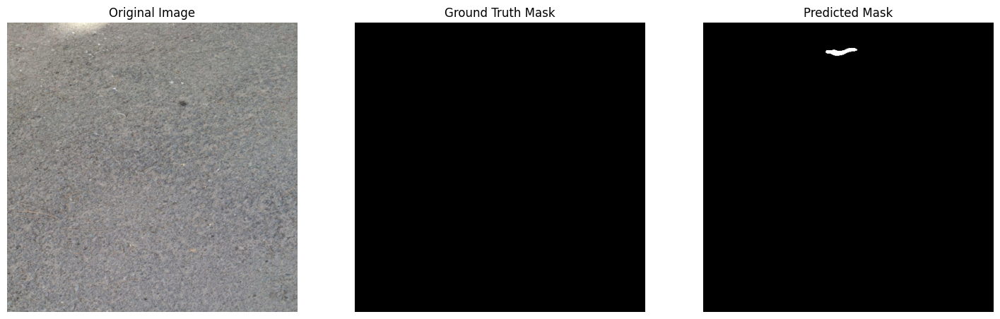

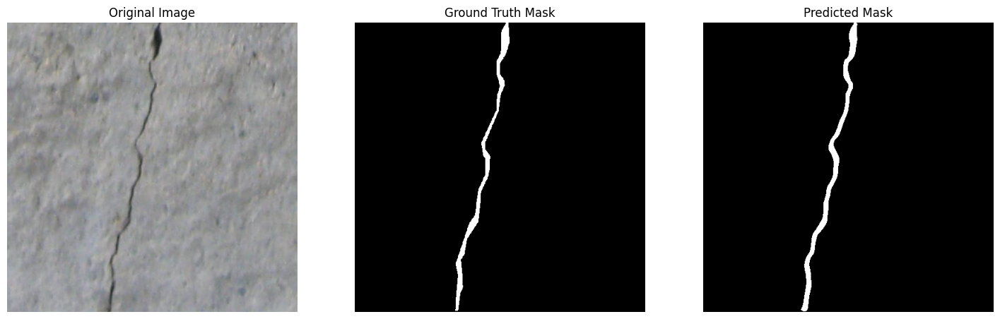

In [8]:
# --- Define Helper Function for Visualization ---
# This function takes a model and visualizes its predictions on a few test images.
# We define it here so it's available right after training.
def visualize_predictions(model, loader, device, num_images=5):
    """
    Visualizes predictions for a given model on a specified number of images
    that contain ground truth cracks.
    """
    model.eval()
    images_shown = 0
    with torch.no_grad():
        for inputs, masks in loader:
            # Only proceed if we haven't shown enough images
            if images_shown >= num_images:
                break
            
            inputs = inputs.to(device)
            outputs = model(inputs)
            preds = torch.sigmoid(outputs) > 0.5

            for i in range(inputs.size(0)):
                # Stop if we've shown enough images
                if images_shown >= num_images:
                    break

                # Only visualize images that actually have cracks in the ground truth
                if masks[i].sum() > 0: 
                    image = inputs[i]
                    # De-normalize for correct viewing
                    inv_normalize = transforms.Normalize(
                        mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
                        std=[1/0.229, 1/0.224, 1/0.225]
                    )
                    image = inv_normalize(image).permute(1, 2, 0).cpu().numpy()
                    
                    gt_mask = masks[i].cpu().numpy()
                    pred_mask = preds[i].squeeze().cpu().numpy()

                    # Plotting
                    plt.figure(figsize=(18, 6))
                    plt.subplot(1, 3, 1)
                    plt.title("Original Image")
                    plt.imshow(image)
                    plt.axis('off')
                    
                    plt.subplot(1, 3, 2)
                    plt.title("Ground Truth Mask")
                    plt.imshow(gt_mask, cmap='gray')
                    plt.axis('off')

                    plt.subplot(1, 3, 3)
                    plt.title("Predicted Mask")
                    plt.imshow(pred_mask, cmap='gray')
                    plt.axis('off')
                    
                    plt.show()
                    images_shown += 1


# --- Immediate Evaluation of Model A ---
print("--- Evaluating Model A: Baseline on Test Set ---")

# Ensure the model is in evaluation mode
model_a.eval()

# Calculate and print metrics using the previously defined 'calculate_metrics' function
iou_a, dice_a = calculate_metrics(model_a, test_loader, DEVICE)
print(f"\nModel A - Test Set Performance:")
print(f"  - Average Intersection over Union (IoU): {iou_a:.4f}")
print(f"  - Average Dice Score: {dice_a:.4f}")


# --- Visualize Predictions for Model A ---
print("\n--- Visualizing Model A Predictions on Test Images ---")
visualize_predictions(model_a, test_loader, DEVICE, num_images=5)

In [9]:
# --- Augmentation Function (OpenCV & NumPy) ---
def custom_augment(image, mask):
    # Convert PIL to NumPy
    image_np = np.array(image)
    mask_np = np.array(mask)
    
    # Apply a randomly chosen augmentation with 1/6 probability for each
    aug_choice = random.randint(0, 5)

    # 1. Random Rotation
    if aug_choice == 0:
        angle = random.uniform(-30, 30)
        h, w = image_np.shape[:2]
        center = (w // 2, h // 2)
        M = cv2.getRotationMatrix2D(center, angle, 1.0)
        image_np = cv2.warpAffine(image_np, M, (w, h))
        mask_np = cv2.warpAffine(mask_np, M, (w, h), flags=cv2.INTER_NEAREST)

    # 2. Random Scaling
    elif aug_choice == 1:
        scale = random.uniform(0.8, 1.2)
        h, w = image_np.shape[:2]
        new_h, new_w = int(h * scale), int(w * scale)
        image_resized = cv2.resize(image_np, (new_w, new_h), interpolation=cv2.INTER_LINEAR)
        mask_resized = cv2.resize(mask_np, (new_w, new_h), interpolation=cv2.INTER_NEAREST)
        # Pad or crop to original size
        delta_w, delta_h = new_w - w, new_h - h
        top, bottom = abs(delta_h) // 2, abs(delta_h) - (abs(delta_h) // 2)
        left, right = abs(delta_w) // 2, abs(delta_w) - (abs(delta_w) // 2)
        
        if scale > 1.0: # Crop
            image_np = image_resized[top:top+h, left:left+w]
            mask_np = mask_resized[top:top+h, left:left+w]
        else: # Pad
            image_np = cv2.copyMakeBorder(image_resized, top, bottom, left, right, cv2.BORDER_CONSTANT, value=0)
            mask_np = cv2.copyMakeBorder(mask_resized, top, bottom, left, right, cv2.BORDER_CONSTANT, value=0)

    # 3. Brightness Adjustment
    elif aug_choice == 2:
        value = random.uniform(-0.2, 0.2)
        hsv = cv2.cvtColor(image_np, cv2.COLOR_RGB2HSV)
        h, s, v = cv2.split(hsv)
        v = cv2.add(v, int(value * 255))
        v = np.clip(v, 0, 255)
        final_hsv = cv2.merge((h, s, v))
        image_np = cv2.cvtColor(final_hsv, cv2.COLOR_HSV2RGB)

    # 4. Contrast Adjustment
    elif aug_choice == 3:
        value = random.uniform(0.8, 1.2) # contrast factor
        image_np = cv2.convertScaleAbs(image_np, alpha=value, beta=0)

    # 5. Gaussian Noise
    elif aug_choice == 4:
        mean = 0
        stddev = 10
        noise = np.zeros(image_np.shape, np.uint8)
        cv2.randn(noise, mean, stddev)
        image_np = cv2.add(image_np, noise)

    # No augmentation for aug_choice == 5
    
    # Convert back to PIL
    return Image.fromarray(image_np), Image.fromarray(mask_np)

# --- Create Augmented Dataset and Loader ---
# We reuse the original train_dataset's indices for consistency
augmented_train_dataset = AsphaltDataset(
    image_dir=IMAGE_DIR,
    annotation_file=ANNOTATION_FILE,
    transform=base_transforms,
    augment_fn=custom_augment
)

# Apply the split indices to the new augmented dataset instance
augmented_train_dataset = torch.utils.data.Subset(augmented_train_dataset, train_dataset.indices)

train_loader_augmented = DataLoader(
    augmented_train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2
)

# --- Verify Augmentation ---
print("--- Verifying Augmentations ---")
original_img, original_mask = train_dataset[15]
augmented_img_pil, augmented_mask_pil = custom_augment(
    transforms.ToPILImage()(original_img * 0.225 + 0.45), # A crude de-norm for PIL conversion
    transforms.ToPILImage()(original_mask)
)

loading annotations into memory...
Done (t=0.08s)
creating index...
index created!
--- Verifying Augmentations ---


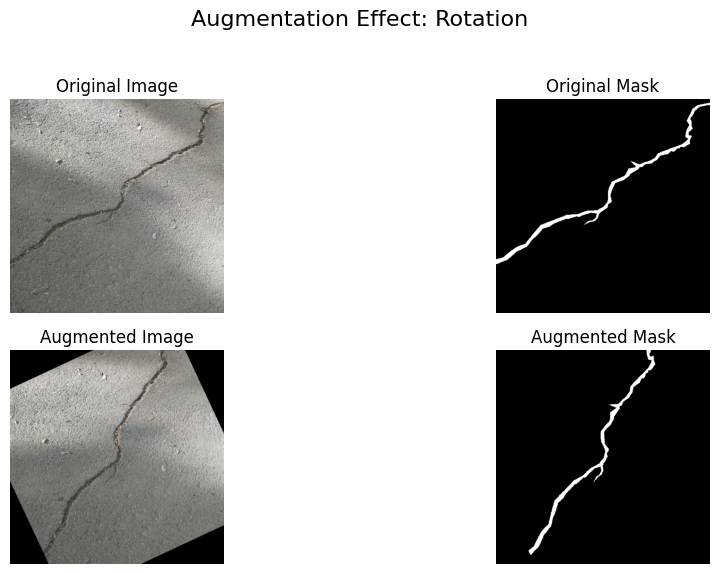

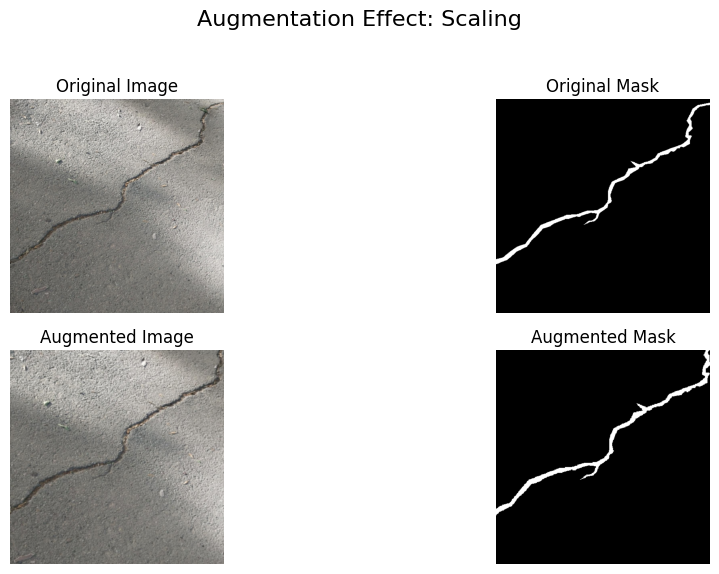

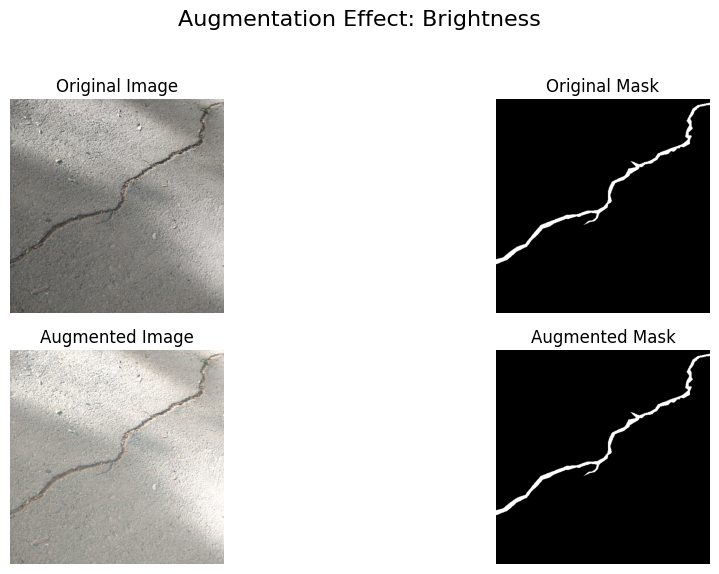

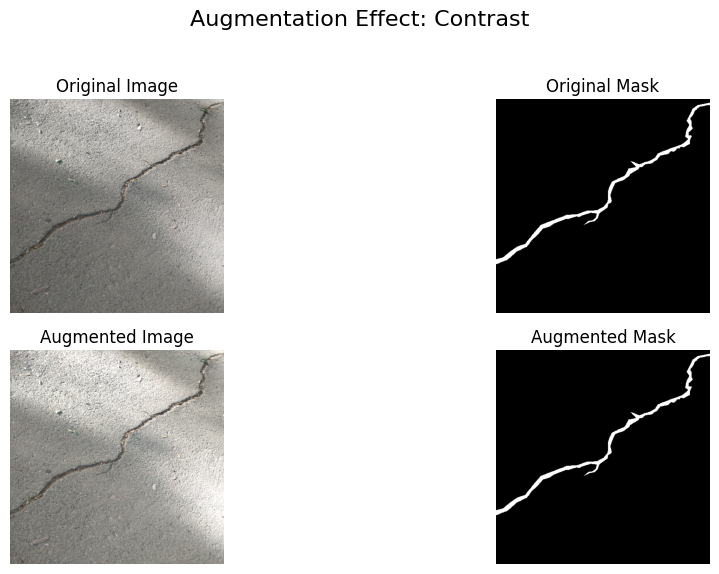

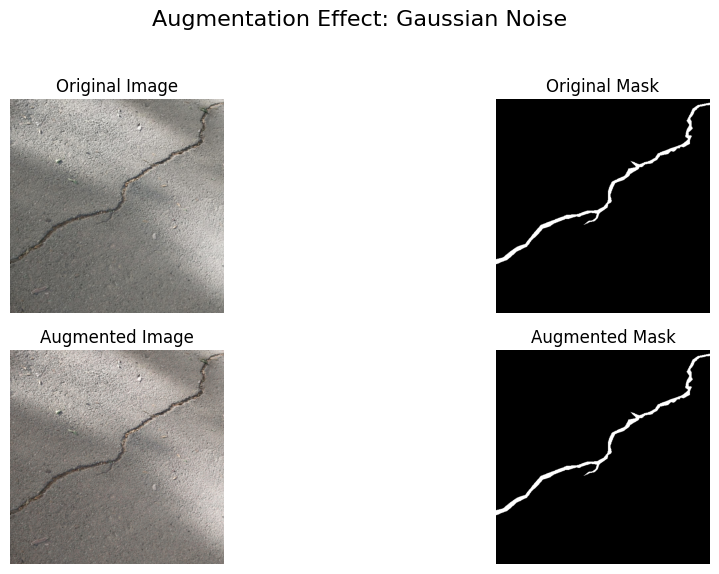

In [10]:
# --- Verification of Each Augmentation Type ---

# First, find a good sample image from the original training set that has a crack
sample_idx_with_crack = -1
for i in range(len(train_dataset)):
    _, mask = train_dataset[i]
    if mask.sum() > 1000: # Ensure the crack is substantial enough to see
        sample_idx_with_crack = i
        break

if sample_idx_with_crack == -1:
    print("Could not find a suitable image with a crack mask in the first few samples.")
else:
    original_img_tensor, original_mask_tensor = train_dataset[sample_idx_with_crack]

    # De-normalize image tensor and convert both to PIL Images for augmentation functions
    inv_normalize = transforms.Normalize(
        mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
        std=[1/0.229, 1/0.224, 1/0.225]
    )
    original_img_pil = transforms.ToPILImage()(inv_normalize(original_img_tensor))
    original_mask_pil = transforms.ToPILImage()(original_mask_tensor)


    # Define individual augmentation functions to test them one-by-one
    def augment_rotate(image, mask):
        angle = 25 # Fixed angle for clear visualization
        h, w = np.array(image).shape[:2]
        center = (w // 2, h // 2)
        M = cv2.getRotationMatrix2D(center, angle, 1.0)
        img_np = cv2.warpAffine(np.array(image), M, (w, h))
        mask_np = cv2.warpAffine(np.array(mask), M, (w, h), flags=cv2.INTER_NEAREST)
        return Image.fromarray(img_np), Image.fromarray(mask_np)

    def augment_scale(image, mask):
        scale = 1.2 # Fixed scale for clear visualization
        h, w = np.array(image).shape[:2]
        new_h, new_w = int(h * scale), int(w * scale)
        img_res = cv2.resize(np.array(image), (new_w, new_h), interpolation=cv2.INTER_LINEAR)
        mask_res = cv2.resize(np.array(mask), (new_w, new_h), interpolation=cv2.INTER_NEAREST)
        # Crop back to original size
        top, left = (new_h - h) // 2, (new_w - w) // 2
        return Image.fromarray(img_res[top:top+h, left:left+w]), Image.fromarray(mask_res[top:top+h, left:left+w])

    def augment_brightness(image, mask):
        value = 0.2 # Fixed brightness increase
        hsv = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2HSV)
        h, s, v = cv2.split(hsv)
        v = np.clip(cv2.add(v, int(value * 255)), 0, 255)
        final_hsv = cv2.merge((h, s, v))
        img_np = cv2.cvtColor(final_hsv, cv2.COLOR_HSV2RGB)
        return Image.fromarray(img_np), mask # Mask is unchanged

    def augment_contrast(image, mask):
        value = 1.2 # Fixed contrast factor
        img_np = cv2.convertScaleAbs(np.array(image), alpha=value, beta=0)
        return Image.fromarray(img_np), mask # Mask is unchanged

    def augment_noise(image, mask):
        noise = np.zeros(np.array(image).shape, np.uint8)
        cv2.randn(noise, 0, 10)
        img_np = cv2.add(np.array(image), noise)
        return Image.fromarray(img_np), mask # Mask is unchanged

    augmentations = {
        "Rotation": augment_rotate,
        "Scaling": augment_scale,
        "Brightness": augment_brightness,
        "Contrast": augment_contrast,
        "Gaussian Noise": augment_noise,
    }

    # Apply and plot each augmentation
    for name, aug_fn in augmentations.items():
        aug_img, aug_mask = aug_fn(original_img_pil.copy(), original_mask_pil.copy())
        
        plt.figure(figsize=(12, 6))
        plt.suptitle(f'Augmentation Effect: {name}', fontsize=16)
        
        plt.subplot(2, 2, 1)
        plt.title("Original Image")
        plt.imshow(original_img_pil)
        plt.axis('off')

        plt.subplot(2, 2, 2)
        plt.title("Original Mask")
        plt.imshow(original_mask_pil, cmap='gray')
        plt.axis('off')
        
        plt.subplot(2, 2, 3)
        plt.title("Augmented Image")
        plt.imshow(aug_img)
        plt.axis('off')

        plt.subplot(2, 2, 4)
        plt.title("Augmented Mask")
        plt.imshow(aug_mask, cmap='gray')
        plt.axis('off')
        
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

--- Training Model B: Custom CNN with Augmentation ---


Epoch 1/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 1/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 1/20 -> Train Loss: 1.3180, Val Loss: 1.2199
  -> New best model saved!


Epoch 2/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 2/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 2/20 -> Train Loss: 1.1359, Val Loss: 1.0488
  -> New best model saved!


Epoch 3/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 3/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 3/20 -> Train Loss: 0.9936, Val Loss: 0.9310
  -> New best model saved!


Epoch 4/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 4/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 4/20 -> Train Loss: 0.8789, Val Loss: 0.8460
  -> New best model saved!


Epoch 5/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 5/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 5/20 -> Train Loss: 0.7867, Val Loss: 0.7506
  -> New best model saved!


Epoch 6/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 6/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 6/20 -> Train Loss: 0.7039, Val Loss: 0.6686
  -> New best model saved!


Epoch 7/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 7/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 7/20 -> Train Loss: 0.6366, Val Loss: 0.6114
  -> New best model saved!


Epoch 8/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 8/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 8/20 -> Train Loss: 0.5944, Val Loss: 0.6208


Epoch 9/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 9/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 9/20 -> Train Loss: 0.5468, Val Loss: 0.5350
  -> New best model saved!


Epoch 10/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 10/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 10/20 -> Train Loss: 0.5258, Val Loss: 0.5317
  -> New best model saved!


Epoch 11/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 11/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 11/20 -> Train Loss: 0.5041, Val Loss: 0.5047
  -> New best model saved!


Epoch 12/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 12/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 12/20 -> Train Loss: 0.4905, Val Loss: 0.5424


Epoch 13/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 13/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 13/20 -> Train Loss: 0.4742, Val Loss: 0.4896
  -> New best model saved!


Epoch 14/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 14/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 14/20 -> Train Loss: 0.4652, Val Loss: 0.4875
  -> New best model saved!


Epoch 15/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 15/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 15/20 -> Train Loss: 0.4610, Val Loss: 0.4741
  -> New best model saved!


Epoch 16/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 16/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 16/20 -> Train Loss: 0.4462, Val Loss: 0.4778


Epoch 17/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 17/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 17/20 -> Train Loss: 0.4407, Val Loss: 0.4696
  -> New best model saved!


Epoch 18/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 18/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 18/20 -> Train Loss: 0.4404, Val Loss: 0.4483
  -> New best model saved!


Epoch 19/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 19/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 19/20 -> Train Loss: 0.4385, Val Loss: 0.4583


Epoch 20/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 20/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 20/20 -> Train Loss: 0.4221, Val Loss: 0.4754


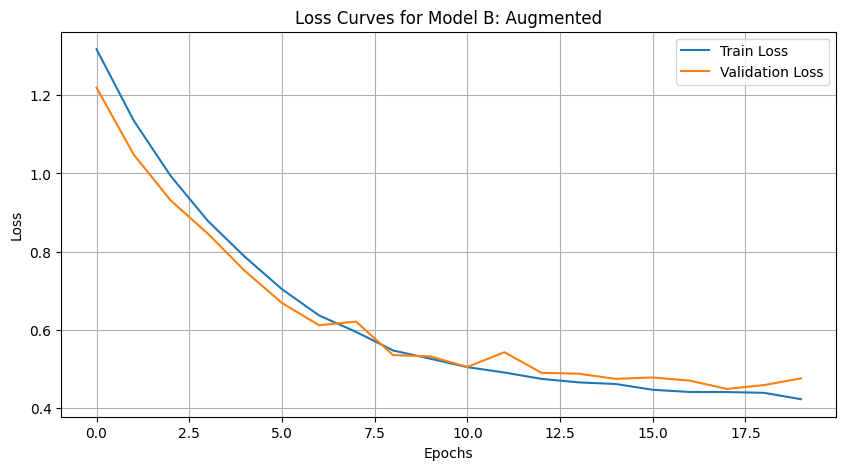

In [11]:
# --- Model B: Augmented Training ---
print("--- Training Model B: Custom CNN with Augmentation ---")

# Initialize Model (same architecture as A), Loss, and Optimizer
model_b = UNetBaseline(in_channels=3, out_channels=1).to(DEVICE)
criterion_b = DiceBCELoss()
optimizer_b = optim.Adam(model_b.parameters(), lr=1e-4)

# Train the model on the augmented data
model_b, history_b = train_model(
    model_b, train_loader_augmented, val_loader, criterion_b, optimizer_b, num_epochs=20
)

# Save the model weights
torch.save(model_b.state_dict(), 'model_b_augmented.pth')

# Plot the loss curves
plot_loss_curves(history_b, "Model B: Augmented")

--- Evaluating Model B: Baseline on Test Set ---


Calculating Metrics:   0%|          | 0/40 [00:00<?, ?it/s]


Model B - Test Set Performance:
  - Average Intersection over Union (IoU): 0.4236
  - Average Dice Score: 0.5332

--- Visualizing Model A Predictions on Test Images ---


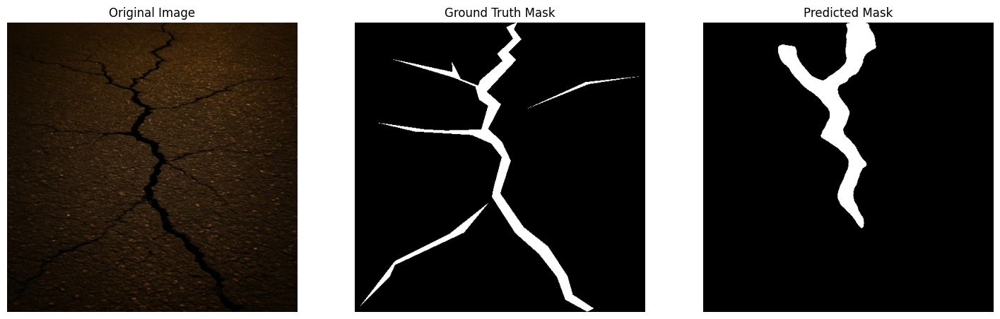

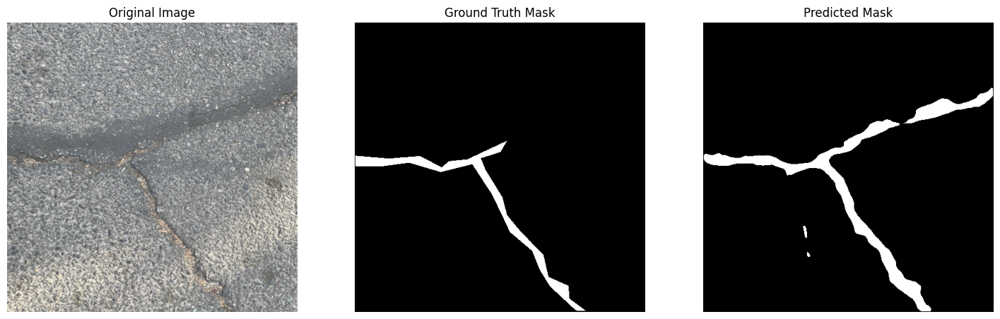

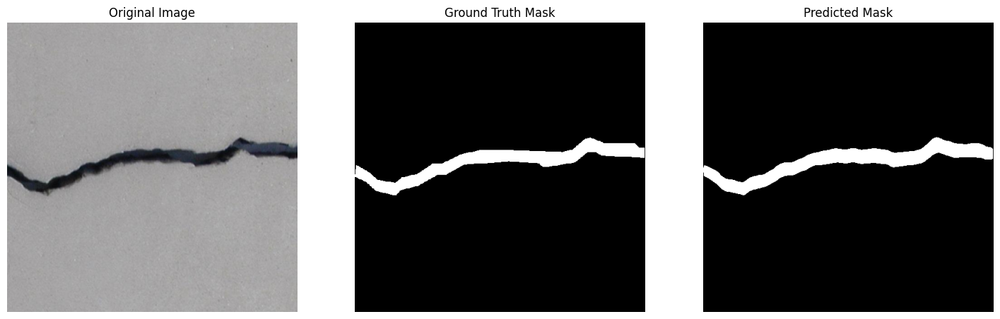

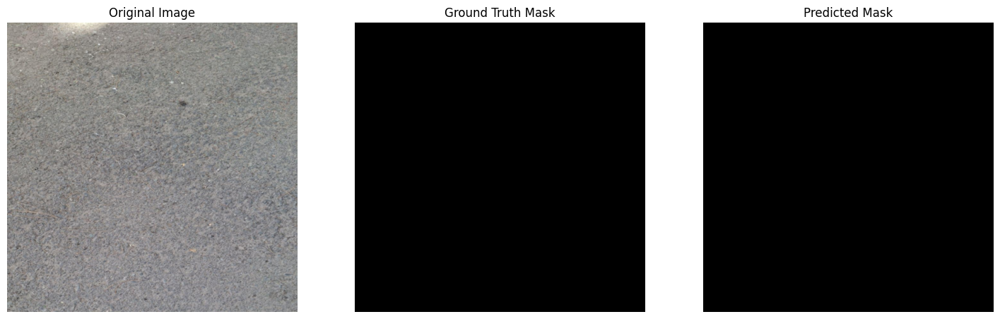

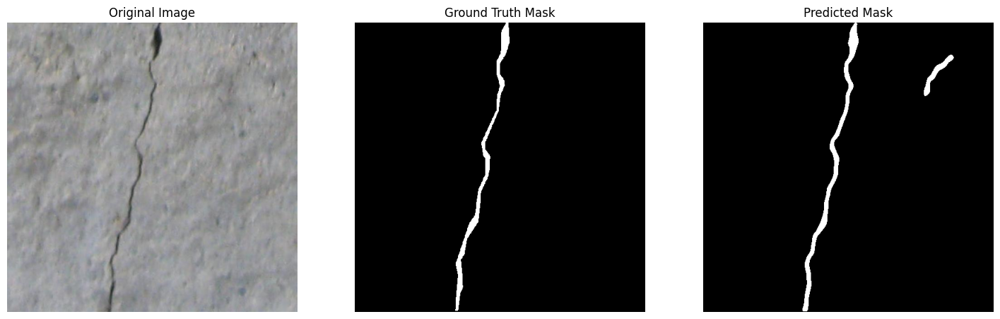

In [12]:
print("--- Evaluating Model B: Baseline on Test Set ---")

# Ensure the model is in evaluation mode
model_b.eval()
iou_b, dice_b = calculate_metrics(model_b, test_loader, DEVICE)
print(f"\nModel B - Test Set Performance:")
print(f"  - Average Intersection over Union (IoU): {iou_b:.4f}")
print(f"  - Average Dice Score: {dice_b:.4f}")


# --- Visualize Predictions for Model A ---
print("\n--- Visualizing Model A Predictions on Test Images ---")
visualize_predictions(model_b, test_loader, DEVICE, num_images=5)

In [13]:
class UNetRegularized(nn.Module):
    def __init__(self, in_channels=3, out_channels=1, features=[64, 128, 256, 512]):
        super(UNetRegularized, self).__init__()
        self.ups = nn.ModuleList()
        self.downs = nn.ModuleList()
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Encoder Part
        for feature in features:
            self.downs.append(ConvBlock(in_channels, feature))
            in_channels = feature
        
        # Decoder Part
        for feature in reversed(features):
            self.ups.append(
                nn.ConvTranspose2d(feature*2, feature, kernel_size=2, stride=2)
            )
            self.ups.append(ConvBlock(feature*2, feature))

        # Bottleneck with Dropout
        self.bottleneck = nn.Sequential(
            ConvBlock(features[-1], features[-1]*2),
            nn.Dropout2d(0.5) # Dropout in bottleneck
        )
        
        # Final convolution
        self.final_conv = nn.Conv2d(features[0], out_channels, kernel_size=1)
        
        # Dropout layers for encoder
        self.dropout_layers = nn.ModuleList([nn.Dropout2d(0.3) for _ in features])


    def forward(self, x):
        skip_connections = []

        # Encoder path with dropout
        for i, down in enumerate(self.downs):
            x = down(x)
            skip_connections.append(x)
            x = self.pool(x)
            if i < len(self.dropout_layers): # Apply dropout after pooling
                 x = self.dropout_layers[i](x)
        
        x = self.bottleneck(x)
        skip_connections = skip_connections[::-1]

        # Decoder path
        for idx in range(0, len(self.ups), 2):
            x = self.ups[idx](x)
            skip_connection = skip_connections[idx//2]
            
            if x.shape != skip_connection.shape:
                x = transforms.functional.resize(x, size=skip_connection.shape[2:])

            concat_skip = torch.cat((skip_connection, x), dim=1)
            x = self.ups[idx+1](concat_skip)

        return self.final_conv(x)

--- Training Model C: Regularized Custom CNN ---


Epoch 1/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 1/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 1/20 -> Train Loss: 1.2619, Val Loss: 1.2279
  -> New best model saved!


Epoch 2/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 2/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 2/20 -> Train Loss: 1.0823, Val Loss: 1.1027
  -> New best model saved!


Epoch 3/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 3/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 3/20 -> Train Loss: 0.9586, Val Loss: 0.9502
  -> New best model saved!


Epoch 4/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 4/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 4/20 -> Train Loss: 0.8606, Val Loss: 0.8260
  -> New best model saved!


Epoch 5/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 5/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 5/20 -> Train Loss: 0.7681, Val Loss: 0.7431
  -> New best model saved!


Epoch 6/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 6/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 6/20 -> Train Loss: 0.7050, Val Loss: 0.6684
  -> New best model saved!


Epoch 7/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 7/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 7/20 -> Train Loss: 0.6479, Val Loss: 0.6102
  -> New best model saved!


Epoch 8/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 8/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 8/20 -> Train Loss: 0.6022, Val Loss: 0.6179


Epoch 9/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 9/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 9/20 -> Train Loss: 0.5723, Val Loss: 0.5544
  -> New best model saved!


Epoch 10/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 10/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 10/20 -> Train Loss: 0.5511, Val Loss: 0.5389
  -> New best model saved!


Epoch 11/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 11/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 11/20 -> Train Loss: 0.5389, Val Loss: 0.5434


Epoch 12/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 12/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 12/20 -> Train Loss: 0.5109, Val Loss: 0.5153
  -> New best model saved!


Epoch 13/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 13/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 13/20 -> Train Loss: 0.5040, Val Loss: 0.5006
  -> New best model saved!


Epoch 14/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 14/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 14/20 -> Train Loss: 0.4987, Val Loss: 0.5349


Epoch 15/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 15/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 15/20 -> Train Loss: 0.4829, Val Loss: 0.4942
  -> New best model saved!


Epoch 16/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 16/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 16/20 -> Train Loss: 0.4826, Val Loss: 0.4831
  -> New best model saved!


Epoch 17/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 17/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 17/20 -> Train Loss: 0.4868, Val Loss: 0.4898


Epoch 18/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 18/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 18/20 -> Train Loss: 0.4699, Val Loss: 0.4839


Epoch 19/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 19/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 19/20 -> Train Loss: 0.4692, Val Loss: 0.4836


Epoch 20/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 20/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 20/20 -> Train Loss: 0.4664, Val Loss: 0.4764
  -> New best model saved!


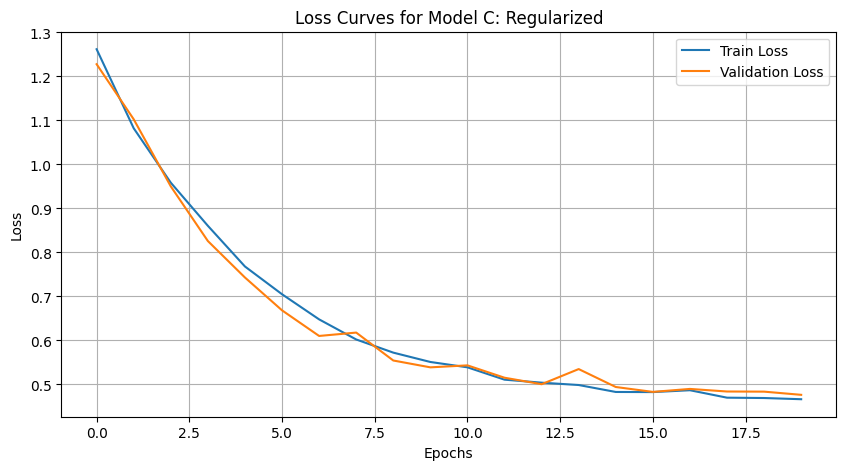

In [14]:
# --- Model C: Regularized Training ---
print("--- Training Model C: Regularized Custom CNN ---")

# Initialize Model, Loss, and Optimizer
model_c = UNetRegularized(in_channels=3, out_channels=1).to(DEVICE)
criterion_c = DiceBCELoss()
optimizer_c = optim.Adam(model_c.parameters(), lr=1e-4)

# Train the model on the original (non-augmented) data
model_c, history_c = train_model(
    model_c, train_loader, val_loader, criterion_c, optimizer_c, num_epochs=20
)

# Save the model weights
torch.save(model_c.state_dict(), 'model_c_regularized.pth')

# Plot the loss curves
plot_loss_curves(history_c, "Model C: Regularized")

--- Evaluating Model C: Baseline on Test Set ---


Calculating Metrics:   0%|          | 0/40 [00:00<?, ?it/s]


Model B - Test Set Performance:
  - Average Intersection over Union (IoU): 0.4120
  - Average Dice Score: 0.5206

--- Visualizing Model A Predictions on Test Images ---


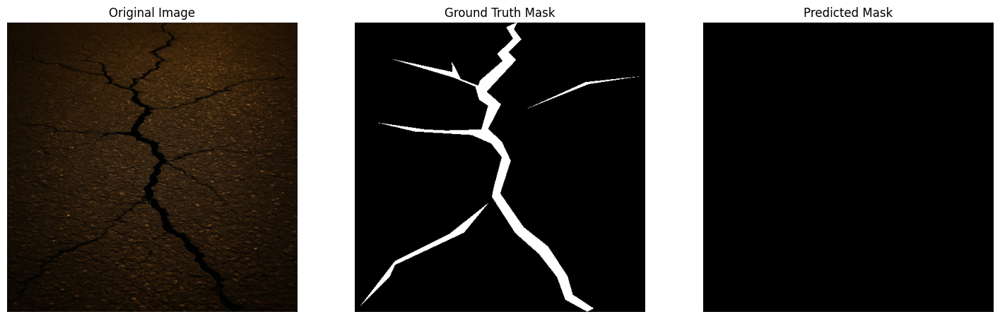

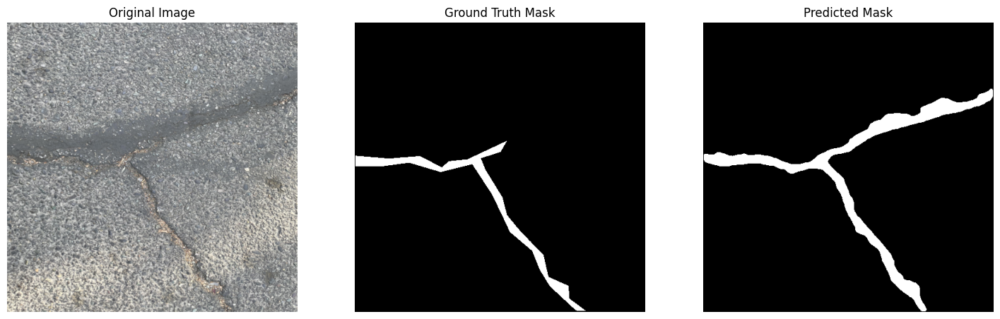

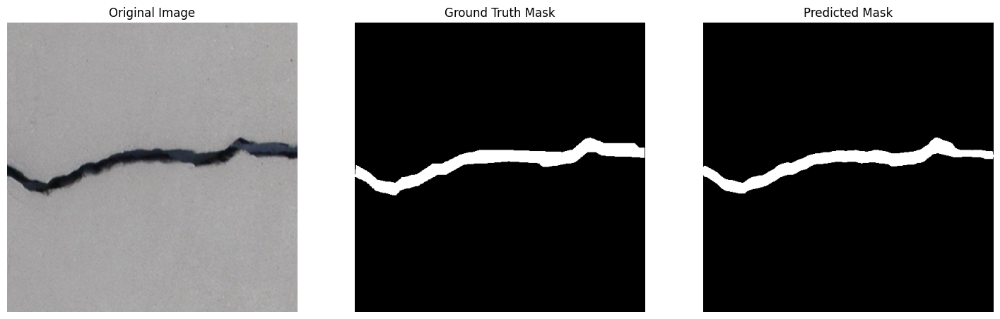

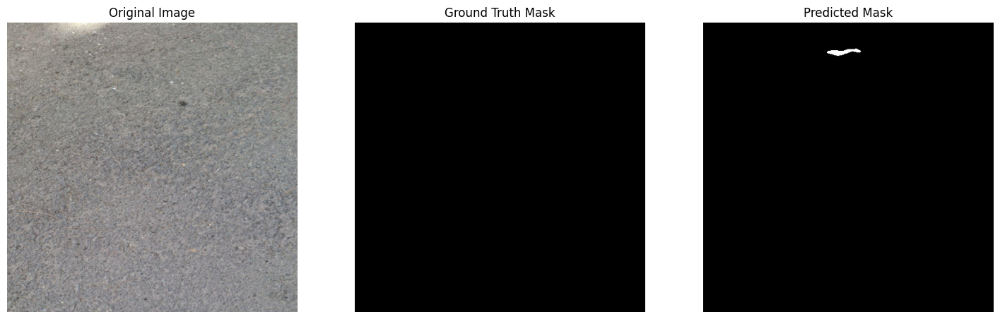

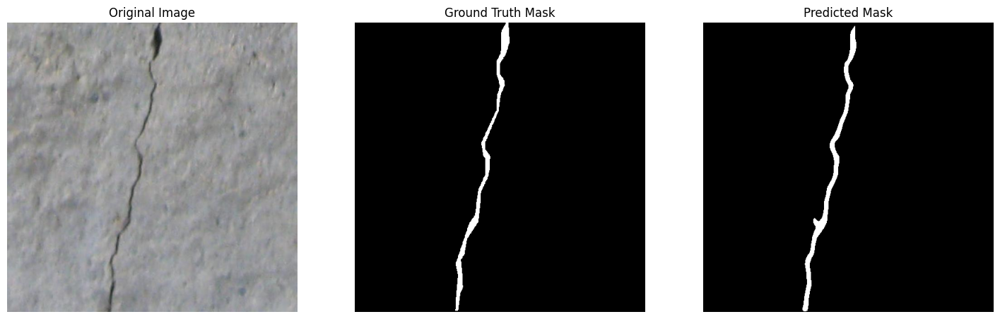

In [15]:
print("--- Evaluating Model C: Baseline on Test Set ---")

# Ensure the model is in evaluation mode
model_c.eval()
iou_c, dice_c = calculate_metrics(model_c, test_loader, DEVICE)
print(f"\nModel B - Test Set Performance:")
print(f"  - Average Intersection over Union (IoU): {iou_c:.4f}")
print(f"  - Average Dice Score: {dice_c:.4f}")


# --- Visualize Predictions for Model A ---
print("\n--- Visualizing Model A Predictions on Test Images ---")
visualize_predictions(model_c, test_loader, DEVICE, num_images=5)

In [16]:
# --- Corrected Model D Architecture ---

class DecoderBlock(nn.Module):
    """
    Corrected decoder block.
    It takes the number of input channels from the previous layer,
    the number of channels from the skip connection, and the desired output channels.
    """
    def __init__(self, in_channels, skip_channels, out_channels):
        super(DecoderBlock, self).__init__()
        # This transpose conv upsamples the feature map
        self.up = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)
        # This conv block processes the concatenated feature map
        self.conv = ConvBlock(out_channels + skip_channels, out_channels)

    def forward(self, x, skip_connection):
        x = self.up(x)
        # The resize is a safeguard, but the architecture is now designed to avoid it.
        if x.shape != skip_connection.shape:
            x = transforms.functional.resize(x, size=skip_connection.shape[2:])
        
        x = torch.cat([x, skip_connection], dim=1)
        return self.conv(x)


class UNetResNet(nn.Module):
    """
    A UNet architecture using a pre-trained ResNet-34 encoder.
    This version is corrected to ensure the final output is 512x512.
    """
    def __init__(self, out_channels=1):
        super(UNetResNet, self).__init__()
        
        resnet = models.resnet34(weights=models.ResNet34_Weights.IMAGENET1K_V1)
        
        # --- Encoder Stages ---
        # We capture the output of each stage for skip connections.
        self.initial = nn.Sequential(resnet.conv1, resnet.bn1, resnet.relu) # Out: 256x256
        self.pool = resnet.maxpool # Out: 128x128
        self.encoder1 = resnet.layer1 # Out: 128x128
        self.encoder2 = resnet.layer2 # Out: 64x64
        self.encoder3 = resnet.layer3 # Out: 32x32
        self.encoder4 = resnet.layer4 # Out: 16x16
        
        # --- Bottleneck ---
        self.bottleneck = ConvBlock(512, 1024)

        # --- Decoder Stages ---
        # The number of channels corresponds to the ResNet-34 architecture.
        self.decoder4 = DecoderBlock(1024, 256, 512)
        self.decoder3 = DecoderBlock(512, 128, 256)
        self.decoder2 = DecoderBlock(256, 64, 128)
        self.decoder1 = DecoderBlock(128, 64, 64)
        
        # --- Final Upsampling and Output ---
        # This final block takes the 256x256 feature map from decoder1
        # and upsamples it to the final 512x512 size.
        self.final_up = nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2)
        self.final_conv = nn.Conv2d(32, out_channels, kernel_size=1)

    def forward(self, x):
        # --- Encoder Path ---
        s0 = self.initial(x)     # -> 256x256
        s1_in = self.pool(s0)    # -> 128x128
        s1 = self.encoder1(s1_in)# -> 128x128
        s2 = self.encoder2(s1)   # -> 64x64
        s3 = self.encoder3(s2)   # -> 32x32
        s4 = self.encoder4(s3)   # -> 16x16
        
        # --- Bottleneck ---
        b = self.bottleneck(s4)

        # --- Decoder Path ---
        d4 = self.decoder4(b, s3)
        d3 = self.decoder3(d4, s2)
        d2 = self.decoder2(d3, s1)
        d1 = self.decoder1(d2, s0) # Connects to the 256x256 feature map before pooling
        
        # --- Final Output ---
        out = self.final_up(d1)
        out = self.final_conv(out)
        
        return out

--- Training Model D: Transfer Learning (ResNet-34 U-Net) ---


Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 226MB/s]


Epoch 1/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 1/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 1/20 -> Train Loss: 1.2962, Val Loss: 0.9561
  -> New best model saved!


Epoch 2/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 2/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 2/20 -> Train Loss: 0.7694, Val Loss: 0.6356
  -> New best model saved!


Epoch 3/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 3/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 3/20 -> Train Loss: 0.4788, Val Loss: 0.5300
  -> New best model saved!


Epoch 4/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 4/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 4/20 -> Train Loss: 0.3923, Val Loss: 0.4508
  -> New best model saved!


Epoch 5/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 5/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 5/20 -> Train Loss: 0.3614, Val Loss: 0.4270
  -> New best model saved!


Epoch 6/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 6/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 6/20 -> Train Loss: 0.3417, Val Loss: 0.4146
  -> New best model saved!


Epoch 7/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 7/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 7/20 -> Train Loss: 0.3195, Val Loss: 0.4205


Epoch 8/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 8/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 8/20 -> Train Loss: 0.3058, Val Loss: 0.4062
  -> New best model saved!


Epoch 9/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 9/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 9/20 -> Train Loss: 0.3030, Val Loss: 0.4049
  -> New best model saved!


Epoch 10/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 10/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 10/20 -> Train Loss: 0.2870, Val Loss: 0.4028
  -> New best model saved!


Epoch 11/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 11/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 11/20 -> Train Loss: 0.2769, Val Loss: 0.4267


Epoch 12/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 12/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 12/20 -> Train Loss: 0.2661, Val Loss: 0.4181


Epoch 13/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 13/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 13/20 -> Train Loss: 0.2505, Val Loss: 0.4162


Epoch 14/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 14/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 14/20 -> Train Loss: 0.2509, Val Loss: 0.4109


Epoch 15/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 15/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 15/20 -> Train Loss: 0.2656, Val Loss: 0.4175


Epoch 16/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 16/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 16/20 -> Train Loss: 0.2441, Val Loss: 0.4132


Epoch 17/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 17/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 17/20 -> Train Loss: 0.2356, Val Loss: 0.4135


Epoch 18/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 18/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 18/20 -> Train Loss: 0.2266, Val Loss: 0.4078


Epoch 19/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 19/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 19/20 -> Train Loss: 0.2106, Val Loss: 0.4169


Epoch 20/20 [Train]:   0%|          | 0/182 [00:00<?, ?it/s]

Epoch 20/20 [Val]:   0%|          | 0/39 [00:00<?, ?it/s]

Epoch 20/20 -> Train Loss: 0.1958, Val Loss: 0.4382


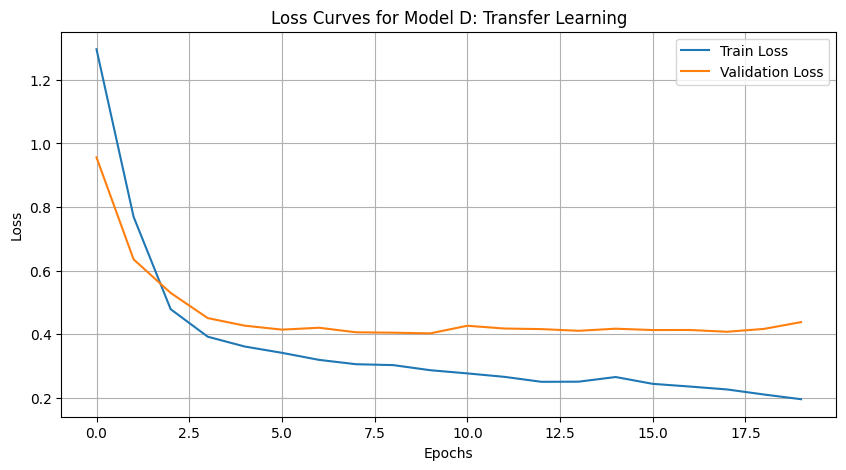

In [17]:
# --- Model D: Transfer Learning Training ---
print("--- Training Model D: Transfer Learning (ResNet-34 U-Net) ---")

# Initialize Model, Loss, and Optimizer
model_d = UNetResNet(out_channels=1).to(DEVICE)
criterion_d = DiceBCELoss()
optimizer_d = optim.Adam(model_d.parameters(), lr=1e-4)

# Train the model on the original (non-augmented) data
model_d, history_d = train_model(
    model_d, train_loader, val_loader, criterion_d, optimizer_d, num_epochs=20
)

# Save the model weights
torch.save(model_d.state_dict(), 'model_d_transfer.pth')

# Plot the loss curves
plot_loss_curves(history_d, "Model D: Transfer Learning")

--- Evaluating Model D: Baseline on Test Set ---


Calculating Metrics:   0%|          | 0/40 [00:00<?, ?it/s]


Model B - Test Set Performance:
  - Average Intersection over Union (IoU): 0.4524
  - Average Dice Score: 0.5610

--- Visualizing Model A Predictions on Test Images ---


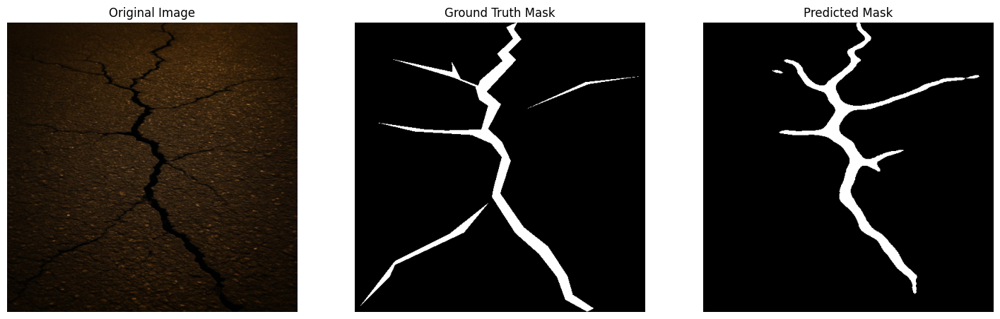

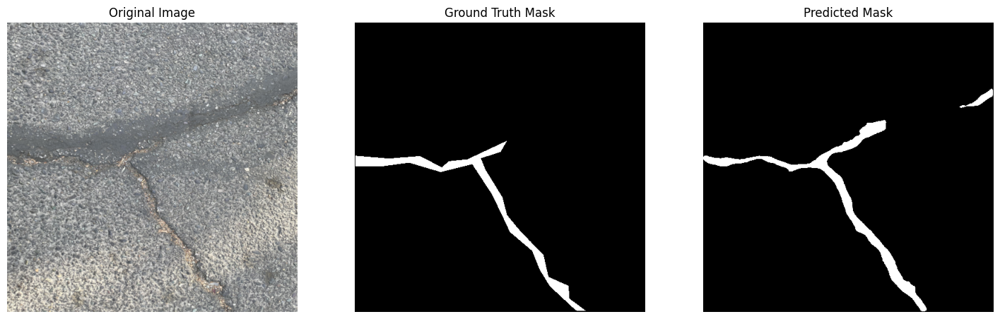

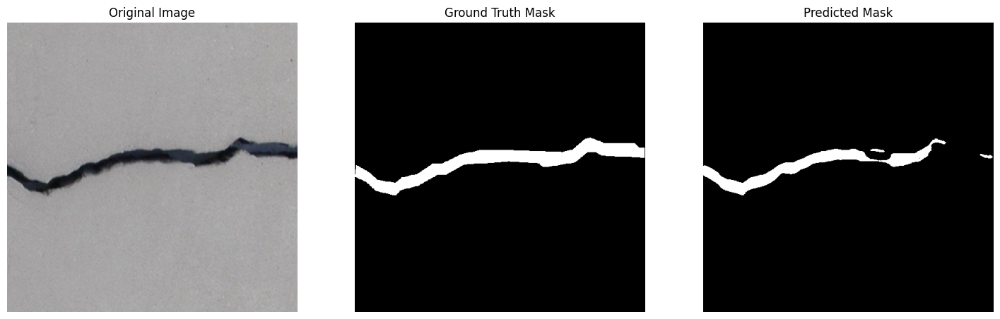

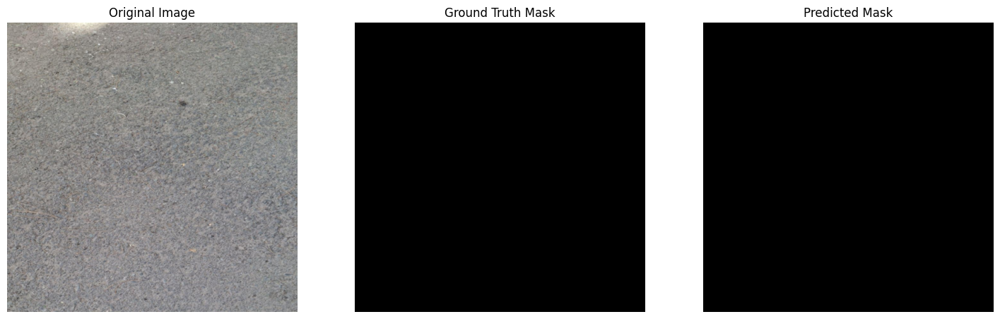

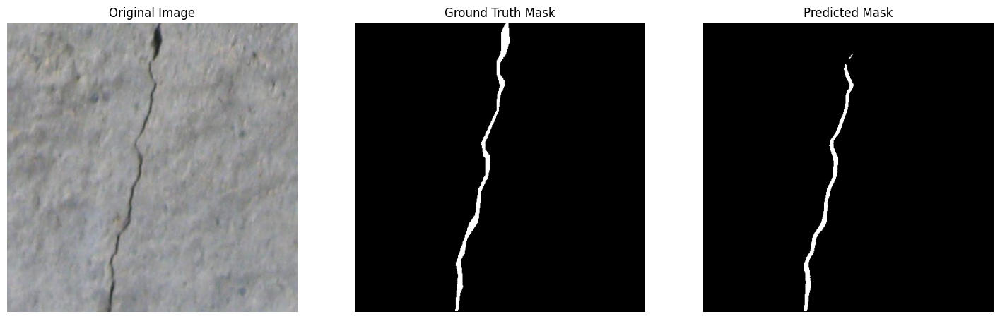

In [18]:
print("--- Evaluating Model D: Baseline on Test Set ---")

# Ensure the model is in evaluation mode
model_d.eval()
iou_d, dice_d = calculate_metrics(model_d, test_loader, DEVICE)
print(f"\nModel B - Test Set Performance:")
print(f"  - Average Intersection over Union (IoU): {iou_d:.4f}")
print(f"  - Average Dice Score: {dice_d:.4f}")


# --- Visualize Predictions for Model A ---
print("\n--- Visualizing Model A Predictions on Test Images ---")
visualize_predictions(model_d, test_loader, DEVICE, num_images=5) 

In [19]:
# --- Evaluation on Test Set ---
print("--- Evaluating all models on the test set ---")

models = {
    "A (Baseline)": UNetBaseline(),
    "B (Augmented)": UNetBaseline(),
    "C (Regularized)": UNetRegularized(),
    "D (Transfer Learning)": UNetResNet()
}

results = []

for name, model_arch in models.items():
    model = model_arch.to(DEVICE)
    model_filename = f"model_{name[0].lower()}_{name.split('(')[1].split(')')[0].lower()}.pth"
    if name == "A (Baseline)": model_filename = "model_a_baseline.pth"
    if name == "D (Transfer Learning)": model_filename = "model_d_transfer.pth"
    
    print(f"\nLoading and evaluating {name} ({model_filename})...")
    model.load_state_dict(torch.load(model_filename, map_location=DEVICE))
    
    iou, dice = calculate_metrics(model, test_loader, DEVICE)
    results.append({
        "Model": name,
        "IoU": iou,
        "Dice Score": dice
    })

# --- Display Results Table ---
results_df = pd.DataFrame(results)
print("\n--- Final Performance Comparison ---")
print(results_df.to_string(index=False))

--- Evaluating all models on the test set ---

Loading and evaluating A (Baseline) (model_a_baseline.pth)...


Calculating Metrics:   0%|          | 0/40 [00:00<?, ?it/s]


Loading and evaluating B (Augmented) (model_b_augmented.pth)...


Calculating Metrics:   0%|          | 0/40 [00:00<?, ?it/s]


Loading and evaluating C (Regularized) (model_c_regularized.pth)...


Calculating Metrics:   0%|          | 0/40 [00:00<?, ?it/s]


Loading and evaluating D (Transfer Learning) (model_d_transfer.pth)...


Calculating Metrics:   0%|          | 0/40 [00:00<?, ?it/s]


--- Final Performance Comparison ---
                Model      IoU  Dice Score
         A (Baseline) 0.419751    0.529214
        B (Augmented) 0.423579    0.533161
      C (Regularized) 0.411998    0.520626
D (Transfer Learning) 0.452396    0.560993



--- Visualizing predictions for the best model: D (Transfer Learning) ---


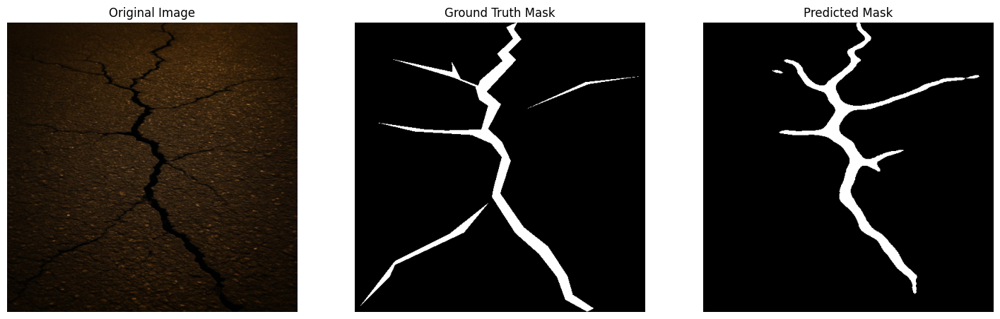

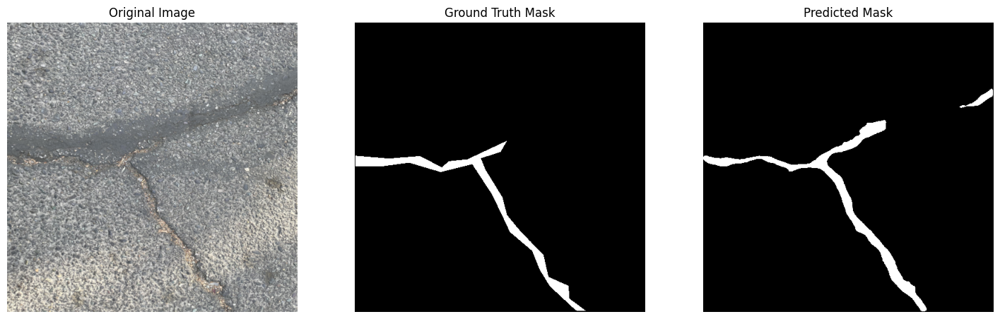

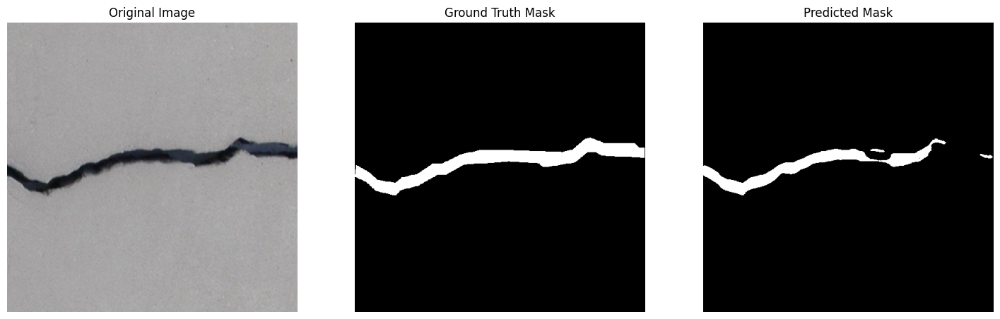

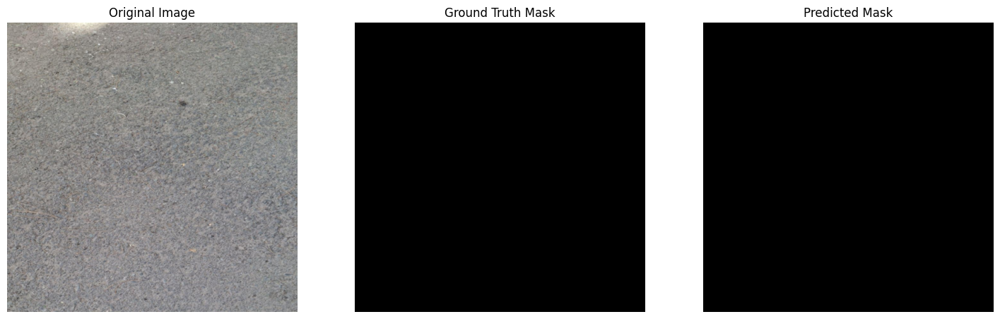

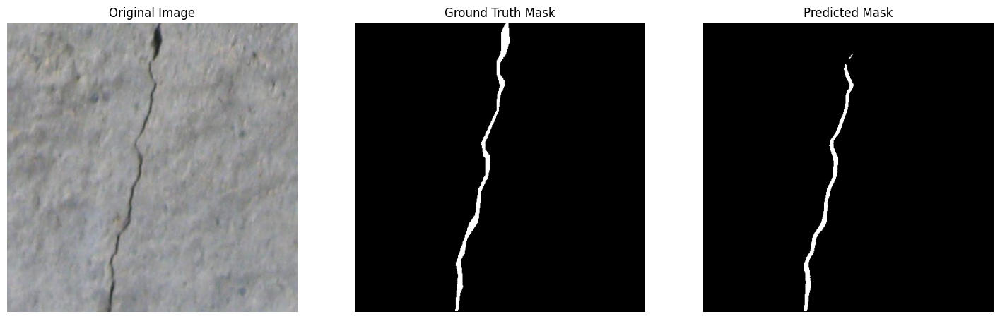

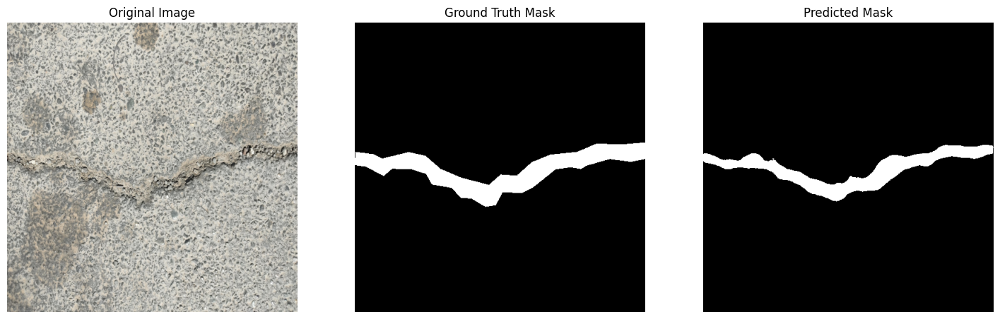

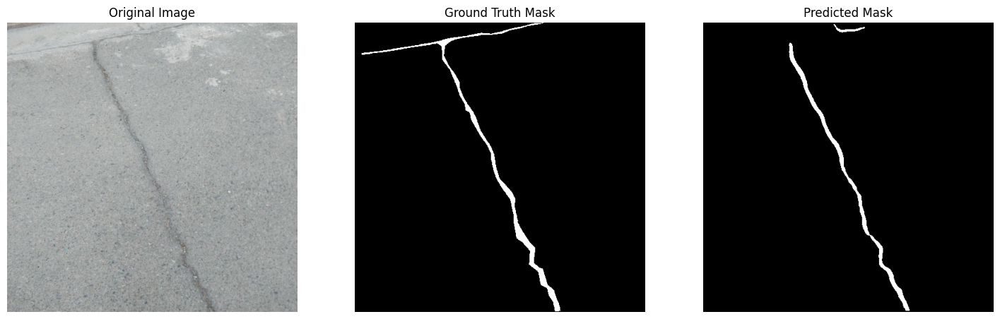

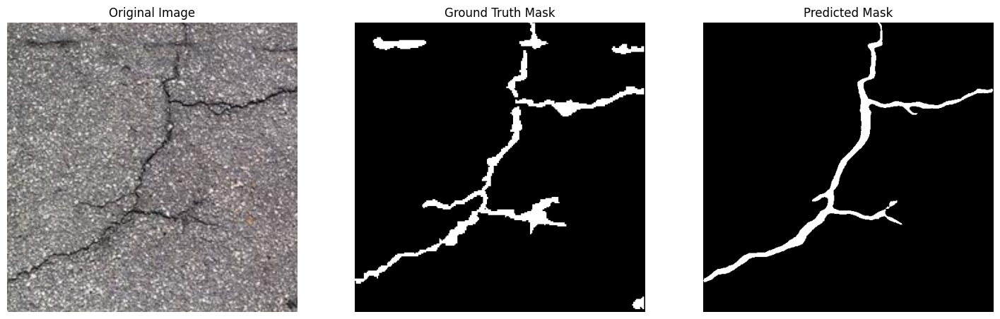

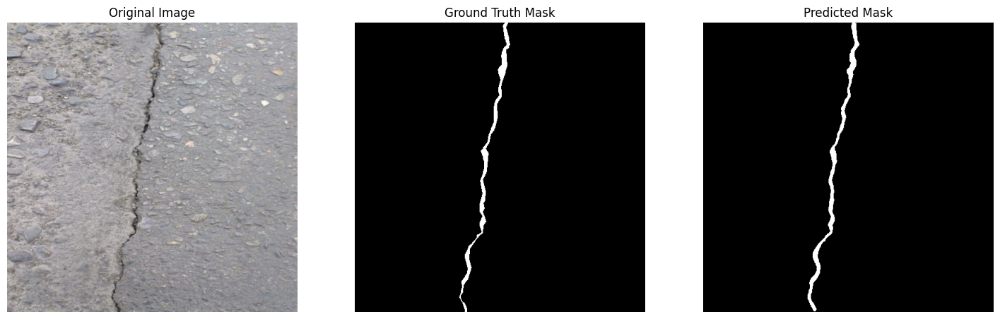

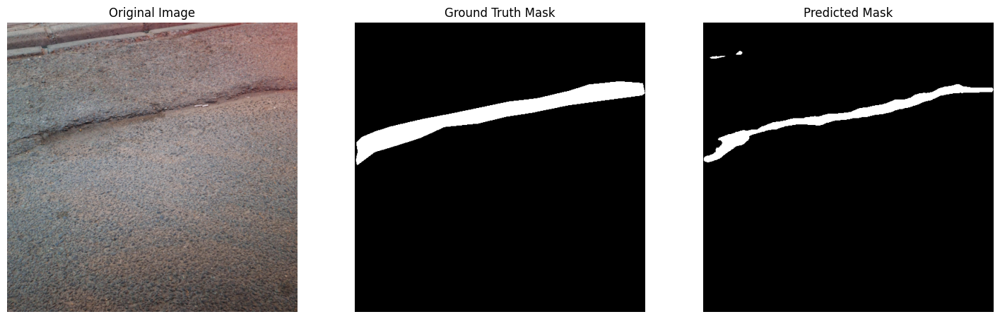

In [20]:
# --- Visualize Predictions of the Best Model ---
best_model_name = results_df.loc[results_df['Dice Score'].idxmax()]['Model']
print(f"\n--- Visualizing predictions for the best model: {best_model_name} ---")

# Load the best model
best_model_arch_key = [k for k in models.keys() if k.startswith(best_model_name[0])][0]
best_model_arch = models[best_model_arch_key]
best_model = best_model_arch.to(DEVICE)
best_model_filename = f"model_{best_model_name[0].lower()}_{best_model_name.split('(')[1].split(')')[0].lower()}.pth"
if best_model_name == "A (Baseline)": best_model_filename = "model_a_baseline.pth"
if best_model_name == "D (Transfer Learning)": best_model_filename = "model_d_transfer.pth"
best_model.load_state_dict(torch.load(best_model_filename, map_location=DEVICE))
best_model.eval()

def visualize_predictions(model, loader, device, num_images=10):
    images_shown = 0
    with torch.no_grad():
        for inputs, masks in loader:
            inputs = inputs.to(device)
            outputs = model(inputs)
            preds = torch.sigmoid(outputs) > 0.5

            for i in range(inputs.size(0)):
                if images_shown >= num_images:
                    return

                # Only visualize images that actually have cracks in the ground truth
                if masks[i].sum() > 0: 
                    image = inputs[i]
                    # De-normalize
                    inv_normalize = transforms.Normalize(
                        mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
                        std=[1/0.229, 1/0.224, 1/0.225]
                    )
                    image = inv_normalize(image).permute(1, 2, 0).cpu().numpy()
                    
                    gt_mask = masks[i].cpu().numpy()
                    pred_mask = preds[i].squeeze().cpu().numpy()

                    plt.figure(figsize=(18, 6))
                    plt.subplot(1, 3, 1)
                    plt.title("Original Image")
                    plt.imshow(image)
                    plt.axis('off')
                    
                    plt.subplot(1, 3, 2)
                    plt.title("Ground Truth Mask")
                    plt.imshow(gt_mask, cmap='gray')
                    plt.axis('off')

                    plt.subplot(1, 3, 3)
                    plt.title("Predicted Mask")
                    plt.imshow(pred_mask, cmap='gray')
                    plt.axis('off')
                    
                    plt.show()
                    images_shown += 1


visualize_predictions(best_model, test_loader, DEVICE)

Running inference on: /kaggle/input/asphalt-segmentation-dataset/train/8_1_jpg.rf.71b931163d2142c94e4370bdea8c7777.jpg


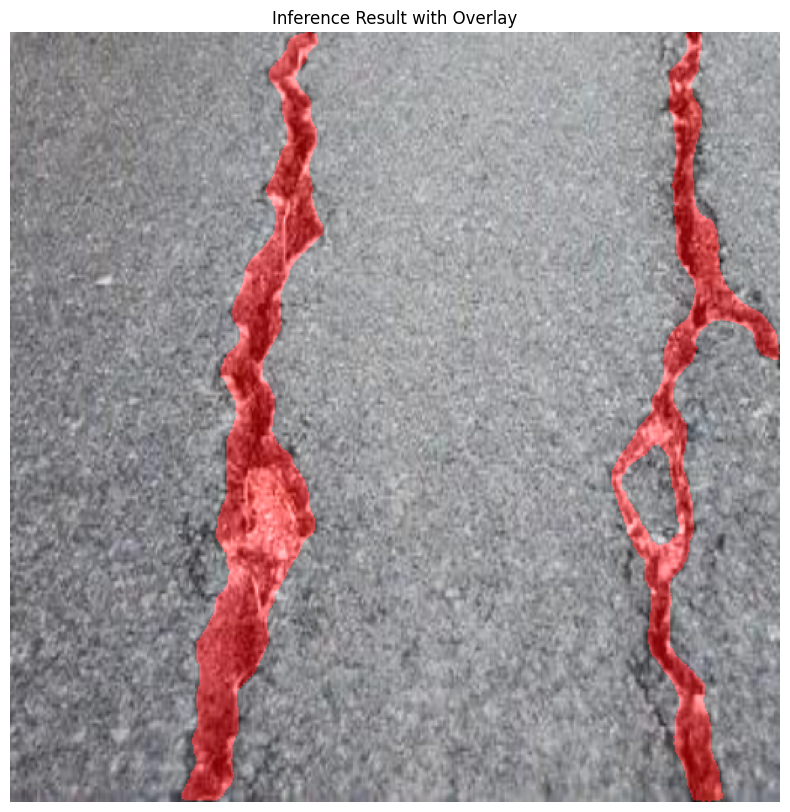

In [21]:
# --- Final Inference Pipeline Function ---
def predict_crack_overlay(model, image_path, device, img_size=512):
    """
    Takes an image file path, runs inference using the provided model,
    and returns an image with the predicted crack mask overlaid.
    """
    model.eval()
    
    # 1. Load and transform the image
    image_pil = Image.open(image_path).convert("RGB")
    
    # Define transforms for a single image
    inference_transform = transforms.Compose([
        transforms.Resize((img_size, img_size), interpolation=Image.BILINEAR),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    
    input_tensor = inference_transform(image_pil).unsqueeze(0).to(device)
    
    # 2. Run inference
    with torch.no_grad():
        output = model(input_tensor)
        pred_mask = torch.sigmoid(output).squeeze().cpu().numpy() > 0.5

    # 3. Create overlay
    # Load original image with OpenCV for color operations
    original_image_cv = cv2.imread(image_path)
    original_image_cv = cv2.cvtColor(original_image_cv, cv2.COLOR_BGR2RGB)
    original_image_cv = cv2.resize(original_image_cv, (img_size, img_size))
    
    # Create a red color mask for the cracks
    overlay = np.zeros_like(original_image_cv, dtype=np.uint8)
    overlay[pred_mask] = [255, 0, 0] # Red color for cracks
    
    # 4. Blend the original image and the overlay
    alpha = 0.5 # Transparency factor
    blended_image = cv2.addWeighted(original_image_cv, 1, overlay, alpha, 0)
    
    # 5. Display the result
    plt.figure(figsize=(10, 10))
    plt.imshow(blended_image)
    plt.title("Inference Result with Overlay")
    plt.axis('off')
    plt.show()


# --- Example Usage ---
# Get a random image path from the test set
test_image_index = test_dataset.indices[50]
test_image_info = full_dataset.coco.loadImgs(full_dataset.image_ids[test_image_index])[0]
test_image_path = os.path.join(IMAGE_DIR, test_image_info['file_name'])

print(f"Running inference on: {test_image_path}")
predict_crack_overlay(best_model, test_image_path, DEVICE)